In [4]:
import twint
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nest_asyncio
import re
from textblob import TextBlob
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords   
from datetime import datetime
import glob                     
import os
nest_asyncio.apply()
#from sqlalchemy import create_engine

In [2]:
candidate_name={'Peter Obi':'peter obi',
    'Atiku Abubakar':'atiku',
    'Asiwaju Tinubu':'tinubu'
    }

In [8]:
def twintConfig(search_string):
    c = twint.Config()
    c.Search = search_string[1]
    c.Limit=1000
    c.Lang = 'en'
    c.Pandas = True
    c.Pandas_au = True          
    c.Pandas_clean=True
    c.Since='2022-01-01'
    c.Until='2022-12-31'
    twint.run.Search(c)

In [9]:
def Run_Twint(search_vals):
    
    #set empty dataframe for join
    out_df= pd.DataFrame()
    
    for candidate in search_vals.items():
        print ("running for search item: "+candidate[0]+"\n")
        print ("Search string: "+candidate[1]+"\n")
        
        #run twint
        twintConfig(candidate)
        
        #get dataframe
        tweets_df = twint.storage.panda.Tweets_df
        
        #join Dataframes and create 'Candidate' column
        tweets_df["Candidate"]= candidate[0]
        out_df = pd.concat([out_df,tweets_df])
        
    return out_df

In [10]:
tweets_df = Run_Twint(candidate_name)

running for search item: Peter Obi

Search string: peter obi

1590060572674256896 2022-11-08 20:15:57 +0100 <ChukwudozieOrji> @FS_Yusuf_ This is situation at hand in Abia state now ,Our principal HE Peter Obi should be in our state on Thursday 10/11 /2022  …They are denying the citizens under our party access to the venue with the excuse of disruption of academic activities  https://t.co/uPquq81IEx
1590060571181084672 2022-11-08 20:15:56 +0100 <am_bashirnr> Here in the North at Borno one of my friend call Yusuf asked me whose peter Gregory Obi, I told him that it's an olosho that change location and start claiming virgin.. chaii  https://t.co/AVJYY54xK0
1590060563589013504 2022-11-08 20:15:54 +0100 <Degreat046> @PeterObi ❤️
1590060558006751233 2022-11-08 20:15:53 +0100 <cop_detriot> @PeterObi King!
1590060557742542848 2022-11-08 20:15:53 +0100 <the_drterry> @Spotlight_Abby @ARISEtv I've said this before @PeterObi and @NgLabour need every platform and opportunity to sell their ideas. He

1590060244381880320 2022-11-08 20:14:38 +0100 <nfiqvogue> "Any Candidate that doesn't come for debates disrespects the Nigerian people." Rufai ( Arise TV News Anchor) This insight was a brilliant analysis of the issues surrounding political debates in Nigeria.  Trend Tags: Chicago Emilokan Dipo EFCC Aquaman Peter Obi  https://t.co/T8Q54rzRJk
1590060202732453889 2022-11-08 20:14:28 +0100 <Baron_d_bash01> Peter Obi is the answer
1590060194322878464 2022-11-08 20:14:26 +0100 <keyo_smash> @Spotlight_Abby God bless the man Chief Sola Ebiseni! God bless the Afenifere! God bless the Video graphics and Video mix man too! And ultimately, God bless Peter Gregory Obi!  Nigeria, your liberty has come!
1590060167629967361 2022-11-08 20:14:20 +0100 <pendusky> @channelstv kindly note that God'swill Akpabio Stadium Capacity is not 10,000 as reported by your correspondent few mins ago. The Capacity is 30,000.   #AkwaIbomTwitter #Uyo Udom | Peter Gregory Obi | Kante
1590060148286189568 2022-11-08 20:14:

1590059512928808962 2022-11-08 20:11:44 +0100 <iamchikasunrise> @ene_chinonso @Kinosi_official @PeterObi @rudeboypsquare @PeterPsquare @frankedoho @mrmacaronii @2niteFlavour @phynofino @iamchikasunrise
1590059488371146752 2022-11-08 20:11:38 +0100 <Koko91676040> You know how empty drum sounds when tapped. Loaded drums with content don't sound when tapped. Whose loaded amongst these two candidates?  Like for Jagaban @officialABAT or retweet for Obi @PeterObi  https://t.co/OoSusQHOcc
1590059466493677568 2022-11-08 20:11:33 +0100 <DoctorFIB> This has Peter Gregory Obi written all over it. #Obidients go and collect your PVC please 👏👏
1590059456053751808 2022-11-08 20:11:30 +0100 <WhalezIsStreet> @Y_chupe @PeterObi Mù ómi si èlèyi lá lè yi nà
1590059454602436609 2022-11-08 20:11:30 +0100 <Bobbydrizzy14> @Mario9jaa @instablog9ja @Qdpaper2  @DeeOneAyekooto  Come and see PETER OBI  GBONMISI OMIOTO FIRE SERVICE 🤣🤣🤣..Go and verify
1590059431957757953 2022-11-08 20:11:25 +0100 <GWiseTime> Wheneve

1590059041861947392 2022-11-08 20:09:52 +0100 <Aguocha19> @Yusuf_Mazaje1 Buhari never dropped statistics and facts he only made fake promises and the poor masses kept shouting SAI BABA. Buhari never had a clean slate or good track record. And Peter obi is actually doing campaign the way it should be not going about sharing rice or wads of cash
1590059034841055232 2022-11-08 20:09:50 +0100 <ms_peacenwa> AFTERMATH OF THE FLOOD IN NIGERIA…..    This is Portharcourt  to Bayelsa, East-West road.  #floodinginnigeria  #LetsDoMore #Flooding   Emilokan Mercy Johnson Reno Omokri #Morocco  Lexus #WakandaForeverID Dipo Udom Bobby Peter Gregory Obi  #WakandaForeverID  https://t.co/fOZqiRmVlw
1590059021524140033 2022-11-08 20:09:47 +0100 <christ_inMi> The idiot  Dipo  cv writer don't want a better Nigeria..you see how he avoided Peter Gregory Obi name in the audio..Obi will be his President. Weda he likes it or not. Useless Phb holders
1590059016491008000 2022-11-08 20:09:46 +0100 <Mroluwatobiloba> 

1590058561195102208 2022-11-08 20:07:57 +0100 <ahmed_oris> JUST IN: Peter Obi supporter threatens to shoot Investigative Journalist, @KemiOlunloyo Dr. Kemi Olunloyo
1590058552915218432 2022-11-08 20:07:55 +0100 <Samson16431231> @omoelerinjare @DocOmeiza @_weyimi @Aikoges @DrMikeEgbebike @CyndiGold2 @doyinokupe @PeterObi @joesahara4 @ChigozieIAlex @ChudeMedia See material Hundred yards
1590058533495926784 2022-11-08 20:07:50 +0100 <remagirlfriend> @adamugarba Peter Obi will help us join in 2023. We heard your agitation.
1590058532300201984 2022-11-08 20:07:50 +0100 <MKBRYANT1993> @D_Olubadan_Eko @DeleFarotimi @PeterObi @officialABAT So you had to display your full name by printing it on temperature scanner? 😆   Only decomposing foul spirited ghoul like you still wallows in the depth of your innate stupidity!  Be gone!
1590058497441689600 2022-11-08 20:07:42 +0100 <SuperSuperc> @emmaikumeh APC- Same faith ticket ❌ PDP- Always contesting ❌ LP- HE. Mr Peter Obi, the best✔️
1590058475979436

1590057954501623809 2022-11-08 20:05:32 +0100 <TopcyKash> @PeterObi  https://t.co/5HiT4BVqjh
1590057936810016770 2022-11-08 20:05:28 +0100 <OnyebuchiFred> @Uncommon_IB @PeterObi So you're saying if your gas cylinder at home caught fire (God forbid) you'll blame the government for not providing preventive measures? I know you're looking for things to fault him at but that doesn't mean you have to go stupid while doing that.
1590057934779650048 2022-11-08 20:05:28 +0100 <Daniel_1of1> @Spotlight_Abby I knew it... The emotion was very raw... May God answer our prayers by giving us Peter Obi in 2023 o.  Kudos on this thread... I watched till the last video!
1590057916865708032 2022-11-08 20:05:23 +0100 <nnee_godsgift> @Mtugold @renoomokri @_dinomelaye @PeterObi No be lie bro. Just go through @realFFK profile and you will think he and Atiku hasn't shake hands before
1590057915175534593 2022-11-08 20:05:23 +0100 <derrimore24> @SenBalaMohammed @OfficialPDPNig You people keep getting it wrong o

1590057631372017664 2022-11-08 20:04:15 +0100 <GarfieldGoodlu4> @GENTLE_JENKINS @PeterObi Our president 🙄
1590057629816336384 2022-11-08 20:04:15 +0100 <ijelebest202> Je vais assister au futur Espace de @PeterObiUSA. Vous viendrez aussi ? #OBIDIENTs #POTownsquare   https://t.co/ledRQIqfli
1590057617195683840 2022-11-08 20:04:12 +0100 <FrankNuris> @NgLabour @YunusaTanko @aburechambers @PeterObi @Kennedy4Aha Please always post His campaigns early + Address &amp; Peter Obi should tweet that He's going to "so so &amp; so "..
1590057607536181248 2022-11-08 20:04:10 +0100 <OfficialBaba_D> @PeterObi My condolences to the affected. Nigeria bleeds daily. We must heal the land.
1590057606613270530 2022-11-08 20:04:09 +0100 <dahukporgeh> @NgLabour @PeterObi @aburechambers @YunusaTanko @Kennedy4Aha God forbid bad thing  for a second I thought Omokri  abeg be putting in caps.   My spinal chest  https://t.co/IJpVw5OnXq
1590057600628166656 2022-11-08 20:04:08 +0100 <Ebuka0042> @PeterObi My president,

1590057097273769984 2022-11-08 20:02:08 +0100 <Classic84073745> @SheikhAnalo Nigeria is not a country tbvh. If Peter Obi was the person in this position would be disqualified immediately
1590057091980414976 2022-11-08 20:02:07 +0100 <SuperSuperc> @teeana_world APC- Same faith ticket ❌ PDP- Always contesting ❌ LP- HE. Mr Peter Obi, the best✔️
1590057076687896576 2022-11-08 20:02:03 +0100 <oti_val> @JamiluSufi @OfficialAPCNg @PeterObi What is this?
1590057074167119872 2022-11-08 20:02:02 +0100 <bravo_justice> @BennyB09907071 @NGRLabourParty @DOlusegun Are you sure that on the voting day some of these guys will not secretly vote for Peter Obi?
1590057034086436864 2022-11-08 20:01:53 +0100 <AlixAli63521602> @frjamesa @ruffydfire I listen to this program just a few minutes ago but this Rufai and Dr Reuben Abati the main issue what makes Peter obi to warn Dino Melaye both of them they did not address it in a true way. So I feel so sorry the kind of people we have in Nigeria as a country toda

1590056567311052800 2022-11-08 20:00:02 +0100 <flexnarnd> @OsmanAkaba @peteblezzy @OfficialBaba_D @PeterObi swears.... i'm heartbroken
1590056561522589697 2022-11-08 20:00:00 +0100 <SuperSuperc> @OgbeniDipo APC- Same faith ticket ❌ PDP- Always contesting ❌ LP- HE. Mr Peter Obi, the best✔️
1590056561233141760 2022-11-08 20:00:00 +0100 <thetrusttv> Peter Obi Claims That Willie Obiano Built The Airport Using The Money He Left In The Anambra State | TRUST TV  Watch The Full Discussion Here:  https://t.co/dPTWCX4LzP  #Obidatti2023 #PeterObi4President #Obidients #2023elections  https://t.co/j4vhDkKAaz
1590056558054240256 2022-11-08 19:59:59 +0100 <OmotolaAyodele6> @realjigi @OfficialBaba_D @PeterObi @OfficialPDPNig As in,all this go and verify won't happen cos they will use their nonsense and stain his white. All the nonsense of the party will be attributed to him.
1590056514802577408 2022-11-08 19:59:49 +0100 <TheLocal_Man> @Idrees_jnrr @LurdChiboi @degov36 @TOpemidayo @TalbaSadiq Relax, I 

1590055860234952704 2022-11-08 19:57:13 +0100 <KingDestinyPra1> This revolution has caught fire in the North ooo... Peter Obi is reigning from every corner... listen to their argument: initially they campaigned based on tribal sentiments but that got them no good, as today the chief of army staff is theirs, police IG is their, Immigration  https://t.co/26AE53zKJg
1590055857697398784 2022-11-08 19:57:12 +0100 <realjigi> @OmotolaAyodele6 @OfficialBaba_D @PeterObi @OfficialPDPNig We thank God,PDP are full of criminals
1590055853650239488 2022-11-08 19:57:11 +0100 <_patrioticguy> Only Peter Obi provides hope for true leadership to Nigerian youths. No inducements. Pure organic support.  Vote wisely #PeterObi4President2023  https://t.co/P5fWhgkatC
1590055852743921664 2022-11-08 19:57:11 +0100 <Princess7758609> @adesina_adele @PeterObi You don't have a heart. If you do , you won't come here your this nonsense reply. You guys should know when to sympathize and when to play politics. Werey !
15

1590055373704433665 2022-11-08 19:55:17 +0100 <remagirlfriend> @Doinggood_ @OgbeniDipo @PeterObi @realFFK @realFFK 🤪🤪🤪
1590055371460075521 2022-11-08 19:55:17 +0100 <Godswill053> @NgLabour @YunusaTanko @aburechambers @PeterObi @Kennedy4Aha Benue will be shot down tomorrow  IFB OBI-DIENTLY
1590055358252580865 2022-11-08 19:55:13 +0100 <timosilver> @I_Am_Ilemona The whole essence of saving is to grow. You can only save in an abundance. If PDP had saved 10% of all the money they stole in 16yrs we won't be where we are today. Peter Obi saved 5% of all income, yet he invested in all sectors, built human capital. Only squanders dont save.
1590055356881076226 2022-11-08 19:55:13 +0100 <solakafinta> @silasonyi @PeterObi Amen 🙏
1590055333841752064 2022-11-08 19:55:08 +0100 <badmusadewale1> @PeterObi Gotham Paradise 🤣🤣🤡🤡
1590055329492275200 2022-11-08 19:55:07 +0100 <DrFredJnr> Thank God for Peter Obi. He's come to put the bar of governance up where it should be. If not, that's how buffoons like

1590054976226611201 2022-11-08 19:53:42 +0100 <OnyePos> This is the school My wife attended, she never stopped preaching the gospel of Peter Obi since
1590054972405977088 2022-11-08 19:53:41 +0100 <uwa_mma> @zulla87 @adesina_adele @PeterObi What is the maintenance culture In This Nigeria like??   Are you guys new to this Country?? Sometimes ah just dey wonder why Nigerians dey this Dumb.
1590054961714712578 2022-11-08 19:53:39 +0100 <vawlenze> @nsmupdate God is truly with Obi. God is silencing lions for his sake. Stop fighting Peter Obi, he’s sent from God if not you go collect woto woto from God. Tinubu is a shame
1590054925706227712 2022-11-08 19:53:30 +0100 <vawlenze> @nairaland God is truly with Obi. God is silencing lions for his sake. Stop fighting Peter Obi, he’s sent from God if not you go collect woto woto from God. Tinubu is a shame
1590054911039139841 2022-11-08 19:53:27 +0100 <Ikechuk86396258> @GazetteNGR US government is indirectly telling Nigerians not to vote for a crimi

1590054307097104387 2022-11-08 19:51:03 +0100 <vawlenze> @RBiakpara @osedaniel01 God is truly with Obi. God is silencing lions for his sake. Stop fighting Peter Obi, he’s sent from God if not you go collect woto woto from God
1590054301078286336 2022-11-08 19:51:01 +0100 <EkuyiwoloVictor> Nigerians should be thinking God by now to have Peter obi as their rescue .
1590054293444653057 2022-11-08 19:50:59 +0100 <CENTIMEE> I have said this many times that @PeterObi’s think-tank team won’t be complete without this man @AbdulMahmud01.  His sincerity and clarity of purpose as well as his analytical power is commendable. @doyinokupe @OselokaHObaze
1590054285374795777 2022-11-08 19:50:58 +0100 <AnatuGreen> Afenifere has once again declared with no doubts that Peter Gregory Obi is the choice candidate of the Yoruba people.  RT!  Bala Mercy Johnson Dipo  Teni Abia Pepper Dablixx Biggest Bird Bella Okagbue Arise TV Datti Tiwa Wizkid Boom Asake Rayo NCCA TG Omori Camel Isrealite Ajah  https://t.co/

1590053689204801536 2022-11-08 19:48:35 +0100 <Francismore_> @realFFK @atiku  https://t.co/gxe2DvyJit  Let’s talk
1590053688617275392 2022-11-08 19:48:35 +0100 <MooAkee> Has it been @PeterObi family has shares with @InnosonGroup @innosonvehicles, he would've invested in the company. After all he did for @fidelitybankplc SABMiller. He is very magnanimous!
1590053686759559168 2022-11-08 19:48:35 +0100 <AnzengeMoses> I noticed Dino Melaye is calm on #channels #politicstoday thanks to @PeterObi  He don turn pastor😂😂
1590053685773598724 2022-11-08 19:48:35 +0100 <Princepachigo> @you4space @PeterObi Yes ooo
1590053653867802624 2022-11-08 19:48:27 +0100 <SheunCrest> For those asking me why they should be supporting PO - let me give you one  The boldness to keep saying I didn't steal public funds while in office and having no one debunk that is one of the reasons you should vote for Peter Obi.  Not many politicians can make that bold claim.
1590053652538224640 2022-11-08 19:48:27 +0100 <InyaJa

1590053144289247232 2022-11-08 19:46:26 +0100 <amkayus> @PeterObi May the souls of the departed rest in peace. Mr President I carry message from Obidients to you. Thanks as you listen. @PeterObi  https://t.co/k9FyMdfyqT
1590053141881683968 2022-11-08 19:46:25 +0100 <SuperSuperc> @ambassador_eddy APC- Same faith ticket ❌ PDP- Always contesting ❌ LP- HE. Mr Peter Obi, the best✔️
1590053139700252672 2022-11-08 19:46:24 +0100 <QueenEagleth> @BLOSSOM4GOOD @PeterObi It is the “fire inferno” for me.
1590053077549453312 2022-11-08 19:46:10 +0100 <DarkTallDude> @NgLabour @PeterObi @aburechambers @YunusaTanko @Kennedy4Aha Enijere papo 😂
1590053076580601856 2022-11-08 19:46:09 +0100 <TheNigerianVoic> Boom: "At this point Clearly And Carefully I Will Vote Peter Obi" - Singer Swears  https://t.co/N8L0sA0XyZ
1590053072512110592 2022-11-08 19:46:08 +0100 <mejai_o> @AgadaGedion @ayisat_opeyemi @PeterObi Caro white🤡
1590053071799091200 2022-11-08 19:46:08 +0100 <vinjyke> @younitybyfogg @PeterObi Sense 

1590052654021246978 2022-11-08 19:44:29 +0100 <AdamaFidelis> @_olumose @PeterObi I need  this T shirt!!! How do get it?
1590052645464862722 2022-11-08 19:44:27 +0100 <PrinceMeloga> They have ugly past.  They have destroyed your present.  Will you allow them to destroy your future again?  Vote wisely. Vote Peter Obi.
1590052626405949442 2022-11-08 19:44:22 +0100 <Doinggood_> @OgbeniDipo Peter Obi ni ama  dibo fun! ✅  Ko ju be lo.  Tribalism won't take us anywhere.  The crime of @PeterObi is his region, religion and being allergic to corruption.  https://t.co/meECTDrwCQ
1590052626384969728 2022-11-08 19:44:22 +0100 <rovingnaija> Politics &amp; Governance  Fani Kayode Slams Atiku Over Dino Melaye’s Attack On Peter Obi At Arise TV Town Hall Session  https://t.co/96hF2qxP5K  #AtikuOkowa2023 #PeterObi4President2023
1590052613294526464 2022-11-08 19:44:19 +0100 <JulietK28155725> @adesina_adele @PeterObi Who dey talk please?
1590052591006027776 2022-11-08 19:44:14 +0100 <GoldMyrrhFranki> ... t

1590052205184241665 2022-11-08 19:42:42 +0100 <IamTommatador> @PeterObi @KestinoLee Amen
1590052202294693888 2022-11-08 19:42:41 +0100 <Chrisbamidele> @badruafees34 @PeterObi 😜😜😜😜😜
1590052195713810432 2022-11-08 19:42:39 +0100 <vawlenze> @mindset_tweet God is truly with Obi. God is silencing lions for his sake. Stop fighting Peter Obi, he’s sent from God if not you go collect woto woto from God
1590052195084693506 2022-11-08 19:42:39 +0100 <domphilz> @Aminaruk @PeterObi Amina, people died. It’s not just properties destroyed.
1590052191456620549 2022-11-08 19:42:38 +0100 <Onowuigboo> @PeterObi Dear Peter Obi, Don't attend that debate hosted by Kadaria  It's a SETUP.  She's a core APC member and 2019 should have taught you that.
1590052179259584512 2022-11-08 19:42:35 +0100 <AfamefuleJ> @AtigogoDaniel @PeterObi Yez bro, he will make him EFCC chairman
1590052174872346624 2022-11-08 19:42:34 +0100 <1Trinix> @PeterObi Marching into the New Nigeria!! Okute Incoming 🏆
1590052157902163973 2022

1590051743399784448 2022-11-08 19:40:52 +0100 <divineezelibe> Contempt? and you are sending him to prison, are you sure they will treat this with regard?  Hmm.  A new Nigeria is possible. #MyVote4Obi @PeterObi
1590051738064932864 2022-11-08 19:40:50 +0100 <Iamvincentnam> @n6oflife6 @PeterObi Person wey no dey react, when him do, everybody dey shiver
1590051735573499905 2022-11-08 19:40:50 +0100 <Unbothe93192853> Peter Obi also weaponized poverty and inflicted suffering on indigenes of Anambra!  Owed workers' salaries Invested public funds in private business Didn't build a single school  Built invincible Dubai in Anambra   All these bast*rds must leave power in 2023.
1590051727461715968 2022-11-08 19:40:48 +0100 <Ireniktop> @PeterObi As we are marching into NEW NIGERIA
1590051720721072128 2022-11-08 19:40:46 +0100 <Esosa30376390> @PeterObi @PeterObi for President..
1590051719899070464 2022-11-08 19:40:46 +0100 <simplySalako> @Kendo81326098 @AdakaIni @SaharaReporters @PeterObi @kendo812

1590051249092964352 2022-11-08 19:38:54 +0100 <rowland84081576> @PeterObi So sad a new
1590051242826690560 2022-11-08 19:38:52 +0100 <King15835770> @PeterObi We will need this guy be working as EFCC bos  https://t.co/5BIV6YyG6I
1590051231862382593 2022-11-08 19:38:50 +0100 <hephzibah_musa1> @renoomokri 😂😂Obi lose his head, so you help him find it? @renoomokri stop fooling around cos @PeterObi had become your nightmare time immemorial, you can't sleep, be Obi-dient and know peace of mind.
1590051227261603840 2022-11-08 19:38:48 +0100 <tennisbackinsal> David Hundeyin  deserve an award for first exposing Pablo Escobar of Nigeria in some country's Pablo will never never contest  Fofona dipo Peter obi emilokon
1590051221809004544 2022-11-08 19:38:47 +0100 <SegunFayose> 2023: Peter Obi’s Supporters Begin Car-Rally Across 36 States  https://t.co/IqbFTpE0jI #PeterObi4President2023
1590051209544880128 2022-11-08 19:38:44 +0100 <vawlenze> @Sports_Doctor2 @urchilla01 @FS_Yusuf_ @UchePOkoye @Jack_

1590050824277102593 2022-11-08 19:37:12 +0100 <chimatanze> @PeterObi This season again 💔
1590050809714446336 2022-11-08 19:37:09 +0100 <Adedayo_2> @PeterObi Why wasn't there Fire service? You want to tell me that you spent 8 years there but you couldn't build an average fire service not to talk of a good one? And you are not ashamed to come out to contest for Presidency? You want to extend failure on all of us? Ridiculous!
1590050809433427968 2022-11-08 19:37:09 +0100 <riky_tg> @BLOSSOM4GOOD @PeterObi My Brother I've been thinking same..
1590050806287732736 2022-11-08 19:37:08 +0100 <chidipeterchuk1> @BishopJakes @PeterObi let's reclaim our country... Speak out Nigeria
1590050805729890304 2022-11-08 19:37:08 +0100 <Life_is_Eazi> @AdeloyeSamuel15 @Olanrew88922495 @ayemojubar @PeterObi Ode
1590050798167560194 2022-11-08 19:37:06 +0100 <kinq_Famous> @okwears__ @PeterObi Tell atiku to patronize you
1590050796259143681 2022-11-08 19:37:06 +0100 <EkuruorhoreD> @channelstv Hahaha, this exactl

1590059703522189312 2022-11-08 20:12:29 +0100 <PPTIKHOME> @AlaminMuhd18 @khalilabubakr @legendkomedian This same @atiku , show GEJ shege. Abeg make Ortom do more.
1590059690805071873 2022-11-08 20:12:26 +0100 <osamedee> @USAO_LosAngeles What about @officialABAT and @atiku who was also found in related issues,what re u guys doing about them bcus these same people re trying to rune Nigeria ...well we shall handle that part ourselves bcus we won't allow them win that election
1590059687055364097 2022-11-08 20:12:25 +0100 <JoelCAnih> I may not be as rich as Atiku  coming 2023  but one thing we will have in common then is that both of us will not rule this country.
1590059674828967937 2022-11-08 20:12:23 +0100 <Greatnessuko> @KadariaAhmed Rearrange the appearance of candidates... Let Tinubu and Atiku come first before PO. Simple!!!
1590059661881151488 2022-11-08 20:12:19 +0100 <OkpanachiSulie1> @realFFK @atiku I agree with you
1590059625457631239 2022-11-08 20:12:11 +0100 <Abbeymmovich> @re

1590058645756473344 2022-11-08 20:08:17 +0100 <OsesuaD> @realFFK @atiku Including Shettima and emilokan
1590058632070037504 2022-11-08 20:08:14 +0100 <Statesman1010> @VictorIsrael_ Atiku is rlly passing through alot
1590058604492902400 2022-11-08 20:08:07 +0100 <Emmychino> Guys, Peter Obi just tweeted 30 minutes ago. I mean His Excellency Peter Gregory Obi. Now I can rest easy😁  Sir, we are not just Obidients, but we'll also walk the miles for you. Swim the oceans for you. You're better than Atiku, Kwankwaso, &amp; Tinubu combined.  Arise TV Afenifere  https://t.co/1SxwaM9pAM
1590058593403174914 2022-11-08 20:08:05 +0100 <tallestjuju> @realFFK @atiku Try buy integrity small is very important
1590058546330468353 2022-11-08 20:07:53 +0100 <AsinyemN> @realFFK @atiku Pls shut up u that is supporting a DRUG lord and BOKO HARAM sponsor are you normal?  https://t.co/qidWAyGwtH
1590058544954736640 2022-11-08 20:07:53 +0100 <Meche4James> Anybody associated with Atiku Abubakar is a partner in cr

1590058016422129664 2022-11-08 20:05:47 +0100 <frankihiale1> @renoomokri Reno, yes Obi will not attend debate again, let it pain well well. Nigerians have heard enough from the incoming president Peter Obi. Let's hear from Atiku. Obi is our next president. Atiku is no longer in the race
1590057978446876672 2022-11-08 20:05:38 +0100 <Accoid> So the presidential candidate of the e.t.c party will not be granting interviews anymore home and abroad unless Bola Tinubu and Atiku back him like a baby to the venue? What a time to be alive.  https://t.co/cHhvgIfrpO
1590057975359553536 2022-11-08 20:05:37 +0100 <g_otinyia> @realFFK @atiku Agbado drugs dealer
1590057968816787456 2022-11-08 20:05:36 +0100 <EzeBuchi17> @renoomokri As you use to insult us we the obideint by calling us ipob without you knowing that you are Boko Haram as you are supporting ATIKU ABUBAKAR from the Northern Zone
1590057965851398144 2022-11-08 20:05:35 +0100 <Eduloves1000> @realFFK @atiku We're waiting for you to defend t

1590057280221110272 2022-11-08 20:02:52 +0100 <Kinganthonyne> @adamci_t @uniquechukwuma @emmaikumeh @atiku @OfficialPDPNig After you will play the victim card when they come for you abi?
1590057273979994112 2022-11-08 20:02:50 +0100 <Okechukwu50> @realFFK @atiku Keep quiet young man.
1590057267658862592 2022-11-08 20:02:49 +0100 <Clemsakin71> Sen Melaye is speaking as ardent supporter of Mr. Atiku. Imagine for a second if Mr. Atiku wins and Mr. Melaye didn't get what he wanted in power sharing. Will he wait a minute before he tear Mr Atiku into pieces.   Reject them, they want to 'capture' power for themselves.
1590057262265270272 2022-11-08 20:02:47 +0100 <Jersey_hub_247> @Pres_Adebayo @doyinokupe @PeterObi @officialABAT @atiku God forbïbś a mugu like you to be the president of Nigeria! Continue seeking contracts or ministerial position… calling a fellow contestant a liar tells it all,you are mãd
1590057228924776448 2022-11-08 20:02:39 +0100 <Teddyblack1234> @Rasheethe This won't make

1590056400461639682 2022-11-08 19:59:22 +0100 <AEkejekwu> I will like Dino to answer why Atiku, didn't condemned the killing of Deborah, he deleted his tweet from twitter ? So if Atiku becomes president tomorrow he will ask to kill  Christians in the country. @channelstv
1590056365418217473 2022-11-08 19:59:13 +0100 <Archy_Woman> @Moscowhite2021 @jacobceestine @realFFK @atiku Just like the way we have 'Repentant Boko-Harams' abi? We should also tolerate 'Repentant Drug-Lord' President?
1590056353355235329 2022-11-08 19:59:11 +0100 <akinsbid> I want to see how a Muslim and Christian fanatics will vote for @officialABAT who has just been declared as our Nigeria Pablo Escobar  Emilokan Atiku/Okowa Wike
1590056350012567552 2022-11-08 19:59:10 +0100 <Eboh01> @muhseenhamza @atiku @BwalaDaniel "Assist God", I greet you. You know, you have been given the right to create and to kill on earth.
1590056330395803648 2022-11-08 19:59:05 +0100 <Utibe58663952> @_dinomelaye you and your likes are the p

1590055256758419459 2022-11-08 19:54:49 +0100 <Arinzecom1981> @realFFK @atiku The truth that your Bugari has never had the courage to say.  Just hear another truth. Nigeria really is a crime scene where criminals are celebrated!  https://t.co/g7MzenCo0H
1590055248512835584 2022-11-08 19:54:47 +0100 <nagge_22528> @HAHayatu The Same Way Wike, Ortom &amp;Co Are Avoiding Atiku Like Leprosy.
1590055206657884160 2022-11-08 19:54:37 +0100 <Tola_Ogunleye> @omonlakiki I hope though that your principal @atiku is aware that you are doing this....when we start now...don't start crying wolf oh. We are the best...
1590055171501199360 2022-11-08 19:54:29 +0100 <Nwoko_ugochukwu> @atiku so sorry for you. Really, you stepped on the wrong people.
1590055131726643200 2022-11-08 19:54:19 +0100 <Prideoflondon11> @realFFK @atiku So is Shettima your proclaimed friend
1590055121861607425 2022-11-08 19:54:17 +0100 <lilchi2k31> @realFFK @atiku  https://t.co/xvpwl3A6CA
1590055106459754496 2022-11-08 19:54:13 +010

1590054260724862978 2022-11-08 19:50:52 +0100 <Ubonabasi_J> @romeocza Them come plenty for hia pass Atiku own.
1590054248410406912 2022-11-08 19:50:49 +0100 <Josephkingsize> @ChudeMedia @atiku Cash out plan for the mikanits
1590054191812464640 2022-11-08 19:50:35 +0100 <boluwan> @ZBobai @savndaniel @kemisavage3772 @InibeheEffiong @AishaYesufu @simon_datto @PeterObi @atiku @officialABAT @KwankwasoRM @NigEducation For me, I sell WAEC scratch card for ₦3000 and NECO for ₦1100
1590054158270627841 2022-11-08 19:50:27 +0100 <wetriumphstill> @mindset_tweet You no do hard talk when dem release Atiku own oo
1590054141564289024 2022-11-08 19:50:23 +0100 <Gistcore1> JUST IN: U.S. court releases certified true copies of Bola Tinubu’s drug dealing, money laundering case in Chicago   https://t.co/1EFEEyAz6r  _______ Peter Obi Seyi North Atiku Bala Mohammed Bank of America Abeokuta Lagos  ECWA 9ice Dipo Onitsha Mercy Chinwo Emilokan EFCC Chairman
1590054128616886274 2022-11-08 19:50:20 +0100 <francha

1590053235473383424 2022-11-08 19:46:47 +0100 <FidelisOluwada1> @realFFK @atiku Oya take @realFFK  https://t.co/Xe7f0s6s4P
1590053230855172097 2022-11-08 19:46:46 +0100 <prince_oludada> @MichaelOkwegba Yes, few days to the election. He withdrew his support for Atiku then. But all his tweets are pro-PDP
1590053209330298881 2022-11-08 19:46:41 +0100 <banibo66> @abbalala3 @atiku Copying LP.  Be original
1590053204045139969 2022-11-08 19:46:40 +0100 <HisKnowledgeabl> @emmaikumeh @atiku @OfficialPDPNig @atiku went to the U.S. to do what?
1590053147166535680 2022-11-08 19:46:26 +0100 <kaykay_shawsky1> @realFFK @atiku But u told us that it is shettima that formed boko haram
1590053124919943168 2022-11-08 19:46:21 +0100 <iam_real_abdul> @johnvehe Who told u that? atiku followed them all the way from naija to london go and verify before u talk
1590053094767095809 2022-11-08 19:46:14 +0100 <official_touchx> Dino melaye just called Wike,a regional champion on AIT ,that Wike cannot stop Atiku’s vo

1590052258859089921 2022-11-08 19:42:54 +0100 <CeciliaIro> @jrnaib2 You don't go to the war front Divided - Atiku said he has moved on, Nigerians are helping him actualize that. Add Bola Moh'd to Atiku's crying list.  https://t.co/q0g5i3kLxM
1590052249744859136 2022-11-08 19:42:52 +0100 <Georgebabs7> @DanielRegha We now have both @atiku &amp; @tinubu U.S. court certified copies of Bola Tinubu's drug dealing, money laundering case in Chicago, &amp; Atiku's money laundering,bribery,global frauds &amp; corruption involving over $2.7 trillions.These 2 crooks  want to be president?? FOLLOW BACK !!!
1590052239468822530 2022-11-08 19:42:50 +0100 <sewnate> @realFFK @atiku Oga getat!! #PeterObiiscoming
1590052237300011009 2022-11-08 19:42:49 +0100 <Vincentchampio2> @cousinray_ Atiku won't give up on the race. He is too power-hungry.
1590052222158503936 2022-11-08 19:42:46 +0100 <HAJI41335532> @realFFK @atiku Noted that this is not the first time it happened in benue?even so called your party th

1590051645693775872 2022-11-08 19:40:28 +0100 <KcUzoka> Please tag Atiku to Reno Mockery's tweets as it has demarketed him more.
1590051627649863680 2022-11-08 19:40:24 +0100 <DrChiemeziem> @emmaikumeh @atiku @OfficialPDPNig I'm not 100% sure of who'll be Nigeria's president come 2023 but I'm 100% sure of who'll never smell the presidency.
1590051622436360192 2022-11-08 19:40:23 +0100 <h12h133> hottest airdrop on the block @KomboElkana @moiz_0309 @KeilunguT @JosepMaPuigvert @medicannabisoil @LindaGlow @JamesTe57362680 @Naresh2489 @Son_0f_The_Soil @bansalamit26 @arturorivarola7 @m_atiku
1590051620897058817 2022-11-08 19:40:22 +0100 <LaurenAddington> hottest airdrop on the block @bansalamit26 @arturorivarola7 @m_atiku @Tony47048181 @Fashionverfied @pippen_malcolm @URISPAR90234835 @jakiurrahman1 @MaxVios @Akhiles06553316 @lizaelaloui2 @Kamna67590375
1590051601901031424 2022-11-08 19:40:18 +0100 <ahmed_oris> @ennyola0015 @atiku Atiku should sell his university to fund his campaign
15900515

1590050796259143681 2022-11-08 19:37:06 +0100 <EkuruorhoreD> @channelstv Hahaha, this exactly what they did to GEJ in 2015, Atiku was actively involved, No one can stop Peter Obi for president.
1590050794438823936 2022-11-08 19:37:05 +0100 <betuyok> @FidelisOluwada1 @atiku @emmaikumeh @SodiqTade @OfficialPDPNig Exercise in futility. Atiku remains the Odinga of Nigeria. Serial loser
1590050781038018560 2022-11-08 19:37:02 +0100 <elelemahmud> Atiku now knows how GEJ felt when he Rotimi Amaechi and the other PDP governors pulled the rug from under his feet. Labor Party, please retire all these politicians in 2023.
1590050779226083328 2022-11-08 19:37:02 +0100 <ChumaOrji3> @MastaAJ @POWERFULALTES @q_ide @IruefiNG U are the one suffering from amnesia if u don't know dat Buhari and Atiku brought dis current regime which has been nonchalant to the current woes of the nation and fastly leading us to a failed state. I remember Peter Obi warning Nigerians in 2014 and no one cared to listen
15900

1590050263444099072 2022-11-08 19:34:59 +0100 <clems_okey> @only1freekid @renoomokri Ok you don't know,@renoomokri is doing his best for Atiku to win so he can come home and get appointment and official residence. He knows Obi and other cannot guarantee him such.
1590050250768920577 2022-11-08 19:34:56 +0100 <voteatiku2023_> @sanniaanu1_1524 @emmaikumeh @atiku ATIKU is accepted in every home in Nigeria actually, and he's becoming president inshallah 🙏 I'm already calling him president sef, President ATIKU ABUBAKAR
1590050247933571072 2022-11-08 19:34:55 +0100 <AyodeleAliu2> @Frankie35260620 @DeleFarotimi I see kwankwaso as a better alternative than Peter Obi so you know because he is a visionary and impactful leader. Then Peter Obi, sowore then Atiku
1590050246151008256 2022-11-08 19:34:55 +0100 <betuyok> @cousinray_ Atiku remains the Odinga of Nigeria. Serial loser. Same way Odinga couldn't win last election even with president's support, is the same way Atiku will lose in 2023.
15900

1590049492354871298 2022-11-08 19:31:55 +0100 <nochie_a> @Ohams4PeterObi @DemolaRewaju @atiku @IAOkowa Where was your Messiah mentioned?   You all keep moving mad like zombies.  If you try this nonsense again, I'll block you🤡
1590049477892911104 2022-11-08 19:31:51 +0100 <517p705> @IbetoChrys @Hermes4life @omonlakiki @atiku I see it the way it is, and I will use it to campaign against him. He has lost this election already. Next life he will have sense.
1590049465045581825 2022-11-08 19:31:48 +0100 <Africamusicbank> You Can’t Force Me Into Media Debates – Tinubu Fires Back At Atiku, Obi  https://t.co/VxFrr7S7HD
1590049436285403136 2022-11-08 19:31:41 +0100 <Bowman99516961> @ukejeihuoma Pdp funked up you can't have Peter obi and choose an atiku an oil theif no na
1590049422326784000 2022-11-08 19:31:38 +0100 <Ketura16647548> @Qdpaper2 The APC'S G11 stood for Tinubu and the PDP'S G5 stand against Atiku all.ate heroes of democracy.
1590049385999917056 2022-11-08 19:31:29 +0100 <tman4tman>

1590048635269840896 2022-11-08 19:28:30 +0100 <GodwinFrancis01> Another good evening to tell Nigerians that @PeterObi will be the next president of the federal republic of NGN. Atiku and Tinubu's camps can only wail frm nw till February, PO will emerge as the President of the federal republic of Nigeria.If u can't accept it relocate to Chad.
1590048603812155392 2022-11-08 19:28:23 +0100 <Chi_becks> @Pres_Adebayo @doyinokupe @PeterObi @officialABAT @atiku @Pres_Adebayo please can you let me know your reason for using the word "liar" on Peter Obi? If you have no good reason with facts, May your land be made desolate. may the labour of your hands be wasted. May you know nothing good in your life. Amen.
1590048600738127872 2022-11-08 19:28:22 +0100 <Barristerfran14> @Roseangel009 @_dinomelaye You called a betrayal a father? A man who and other southern governors agreed that every political party must zone its presidential candidate to the south which he hosted and later agreed to be Atiku’

1590047860480831488 2022-11-08 19:25:26 +0100 <betuyok> @maaziakuchie @FS_Yusuf_ @urchilla01 @ChudeMedia @VictorIsrael_ @IkukuomaC @itzz_blitz1 @iam_ayooyewumi @ayemojubar @AfamDeluxo @Jack_ng01 Omo. No be today Atiku begin share dollars oooo
1590047856261746688 2022-11-08 19:25:25 +0100 <KrierTown> Peter Gregory Obi, the tech bro. This guys eeh!  EFCC chairman bala Mohammed udom atiku  https://t.co/FJbGNtbdZM
1590047812405731328 2022-11-08 19:25:14 +0100 <GotCashWorld> @Ucijomanta Atiku will never succeed Buhari. Never!!!
1590047807536533504 2022-11-08 19:25:13 +0100 <anaiyke> @renoomokri Not true. Their zeal for good governance anda better Nigeria won me, a former Atiku fan to their candidate.
1590047771377422337 2022-11-08 19:25:05 +0100 <OfficialDanAtim> @MayomiAsuku2 @Tony_Ogbuagu @EbiDressman1 @atiku Wike and his G5 hv now till May 29th to make noise.  They are afraid to announce they’re supporting 🦇 coz of the backlash they will receive from their support base
159004776332854477

1590046728182714369 2022-11-08 19:20:56 +0100 <Celestinho8> Sir is not the popular Atiku boy Reno "Omokri" .....is another man called Reno "Onokri"
1590046726865694720 2022-11-08 19:20:55 +0100 <OlufunmiAkadiri> Sam Cooke - A Change Is Gonna Come (Official Lyric Video)  https://t.co/IOBfEd1YdR via @YouTube @PeterObi @officialABAT @atiku #Obedients @NgLabour @OfficialAPCNg @OfficialPDPNig #2023NigeriaElections
1590046718757740544 2022-11-08 19:20:54 +0100 <VictorChukwueb8> @HAHayatu My brother  @HAHayatu, are you sure Atiku is still in this race to win ? Don't you think he's acting as a Spoiler to Obi ? Don't you think it's in his best interest to drop off from the race and support Obi ? We really need to make sure that APC is booted out of power.
1590046706703695875 2022-11-08 19:20:51 +0100 <rasaqadewale> @KadariaAhmed @OfficialPDPNig @atiku and @IAOkowa shouldn’t attends it. @KadariaAhmed is biased during last edition she favored @MBuhari. Beside @OfficialAPCNg is before @OfficialPDP

1590045859173236736 2022-11-08 19:17:29 +0100 <OkorieEdwin> Tell me the difference b/w what Remi Tinubu said against the Igbos in 2019 election &amp; what Atiku said against Igbo &amp; Yoruba people? How can he profile an ethnic group (asking northerners not to vote other tribes) cus of PO &amp; Tinubu? Those clapping for him should watch their back.
1590045833642545152 2022-11-08 19:17:23 +0100 <GRTNIGERIAN> @omonlakiki @atiku Tah Mr man Internet never forget. Maybe you can say that to those you claim that doesn't have access to Internet not to us that do okay.
1590045819566059520 2022-11-08 19:17:19 +0100 <Movement_4_Obi> I just hope that my PDP friends will use their tongue to count their teeth, and do the sensible thing - become Obidient. Especially with regards to the presidency. They can still support PDP in their states.  Because it is really starting to look like Atiku is a sinking ship.
1590045788302106624 2022-11-08 19:17:12 +0100 <Pricelessdyl> @kalgo_idris @GovSamuelOrtom @

1590045003522662400 2022-11-08 19:14:05 +0100 <yourvillageoga> @emmaikumeh @atiku Emma this a serious issue not some twitter banter, if this is true we have a drug lord running for presidency, we all should be worried
1590044990058569733 2022-11-08 19:14:01 +0100 <iamteemonkadash> @zinadabo1 Gal, when did you become Obidient? I've been out of Twitter for a while now and I know you to have spoken highly of Atiku before the Primaries. What has changed? Ups anyways, regardless your choice. I am Obidient though. Cheers
1590044936208285696 2022-11-08 19:13:49 +0100 <Ayodejitreasure> @BonnylifeUche @A_Salkida I'm only angry at mor*ns like u who will rather support an Atiku than a Peter Obi who has a good track record and plans for d country.
1590044906147323905 2022-11-08 19:13:41 +0100 <JoshuaOgunsile> BREAKING: Amidst Rumoured Rift, Bala Muhammed Visits Atiku  https://t.co/wG66b16pVE
1590044901697236992 2022-11-08 19:13:40 +0100 <007burch> @ChudeMedia Atiku will never like this. 😂😂
1590044

1590043728030621696 2022-11-08 19:09:01 +0100 <uniquechukwuma> @emmaikumeh @atiku @OfficialPDPNig I am not a prophet but i am sure Atiku can never smell presidency.
1590043715275718658 2022-11-08 19:08:57 +0100 <zeeboy_17> @Ambrosia_Ijebu @segebee Peter Obi is not better than Atiku. You should know better than deceiving the young ones. Your likes are working for Tinubu.
1590043709936123904 2022-11-08 19:08:56 +0100 <O84830138Favour> @vanguardngrnews The Fulanis are Atiku's brothers, those people have wrecked evil in Benue State, and Atiku have been silent over it. So he deserves the blame.
1590043693808906240 2022-11-08 19:08:52 +0100 <Chaa170> @atiku
1590043684912898048 2022-11-08 19:08:50 +0100 <Fak09> @Hitee_ Abi na wettin Atiku go do for US be this?
1590043664507863041 2022-11-08 19:08:45 +0100 <VictorChukzMD> @mikeyj007 @LABANSON9 They don't need to pitch their tent. Every candidate need der block vote They will wait for the right time to Play their card. Its obvious what Ortom n 

1590042933017055234 2022-11-08 19:05:51 +0100 <pathofjustice> @Pres_Adebayo @doyinokupe @PeterObi @officialABAT @atiku 😂😂😂😂 this clown 🤡🤡 is actually running for office  https://t.co/JCv2NwVk2b
1590042928973778944 2022-11-08 19:05:50 +0100 <Ikemchingy> Atiku and Tinubu last? 😂😂😂 this woman is a yahoo boy 😂
1590042837407748097 2022-11-08 19:05:28 +0100 <MayomiAsuku2> @abbalala3 @atiku Good one.  I love the public awareness on the deceitful @OfficialAPCNg antics. Enough of lies and deceit,hardship and insecurity.
1590042833737523200 2022-11-08 19:05:27 +0100 <naija_gazette> Atiku, Tambuwal, Obaseki, Others To Storm Shettima’s Domain For Presidential Rally  https://t.co/AYrBDbThDI
1590042782730973184 2022-11-08 19:05:15 +0100 <BimpOsinbo> Atiku stated that PDP stands the chance to win the presidential election being one of the oldest political parties in the country. #AtikuOkowa2023 #Okowalition #PDPRecoveryPlan  https://t.co/ykzDky35kv
1590042758102003713 2022-11-08 19:05:09 +0100 <Bobby

1590042079958536193 2022-11-08 19:02:28 +0100 <DavidEboh5> @Angela201045315 Tinubu is not in the lead, but he is ahead of Atiku.
1590042044118237184 2022-11-08 19:02:19 +0100 <EkoPataki> Rumors are spread by those seeing Atiku's victory as a nightmare to them.   We believed with Udom he will continue working hard until he sees the victory of Atiku and the PDP. We are focused.  May Atiku Abubakar and PDP succeed Insha Allah🙏 #AkwaIbomIsPDP  https://t.co/LGduX1OGn5
1590042032177045504 2022-11-08 19:02:16 +0100 <AzeksDr> @KadariaAhmed However I would have loved if Bat and Atiku presented first . Thank you
1590041992557637633 2022-11-08 19:02:07 +0100 <Perikle24> @AbdulMahmud01 I agree to this 100%. Obi must appear after Atiku and Tinubu must have attended.   This is the irreducible minimum
1590041990267211776 2022-11-08 19:02:06 +0100 <Lordsxn> Publish Atiku's USA case file too, chief.
1590041990225309696 2022-11-08 19:02:06 +0100 <GazetteNGR> Bala Muhammed visits Atiku in Abuja amid rift

1590060979462995973 2022-11-08 20:17:34 +0100 <Abbeyli49391825> @FS_Yusuf_ @GazetteNGR Between Obi and his supporters who is the best liar? Earlier it was Omokri now its Tinubu. Lies can set you free.
1590060957090611202 2022-11-08 20:17:28 +0100 <hafizayokunle> @tunmishe_ @taiwoalabiho2 I'm not voting Tinubu
1590060956977332224 2022-11-08 20:17:28 +0100 <channelsonly> @SaharaReporters Tinubu and Atiku's continuous absence in a national debate like this tells you something about their perception of Nigerian politics.
1590060924555079680 2022-11-08 20:17:20 +0100 <Megzy_cumz> @ugo_anderson @g_makuachukwu3 @officialABAT Iswear
1590060901486710785 2022-11-08 20:17:15 +0100 <FestusIwuchukwu> @NgLabour @YunusaTanko @aburechambers @PeterObi @Kennedy4Aha Bola Tinubu is not the Candidate to succeed PMB. If you like, cry till next year!   Leadership is not try and error! We must not repeat same mistake again. What Nigeria needs is a Trustworthy leader.  A President that will tell you to “Go &am

1590060597311598592 2022-11-08 20:16:02 +0100 <stevetom788> @id_azeez @jude_ukaigwe @USAO_LosAngeles @officialABAT I still have more evidence both audios, videos, pictures and certificate with original signatures.  https://t.co/abzyWi5Wcc
1590060589547917312 2022-11-08 20:16:01 +0100 <YoungdonDns> @g_makuachukwu3 @officialABAT 419🙄🙄🙄  https://t.co/LKW6YkFjRT
1590060580517580801 2022-11-08 20:15:58 +0100 <toriola_rotimi> @fkeyamo @officialABAT A wonderful job
1590060543377047553 2022-11-08 20:15:50 +0100 <freshodut> @omonlakiki You no try at all. Where's the picture of this bola tinubu you're talking about, you dence gannio.
1590060541065588736 2022-11-08 20:15:49 +0100 <xagreat> In 2002, Tinubu was given Healthcare Award as the best provider of best health services in Nigeria, Presidential Merit Award for technological Development by the Nigerian Society of Engineers.
1590060540310671360 2022-11-08 20:15:49 +0100 <George3Nwosu> @realFFK Keep deceiving your self, which one has tinubu at

1590060195581161472 2022-11-08 20:14:27 +0100 <Galacticus_O> Kogi State Gov HE Yahaya Bello attends @APC Dinner With Campaign Patrons and Advisers at the Party’s Presidential Campaign Headquarters, Abuja, FCT on Tuesday, 08/11/2022. @officialABAT @OfficialGYBKogi @OfficialAPCNg @APCUKingdom #TREASURE  https://t.co/9u37c4Fsa2
1590060189562343424 2022-11-08 20:14:25 +0100 <Aaliyah_Lillli> Imagine still campaigning for Tinubu ,lmfaoo
1590060173355540480 2022-11-08 20:14:21 +0100 <ikemchrismount> Fbi indicted chimaroke nnamani and Peter mba, the Enugu PDP Guber candidate, for embezzlement of public fund... Chimaroke supports tinubu. USA latest release confims tinubu to be a drug kingpin, money launderer etc. Pls Enugu State, why hasn't anyone sued Peter mba.
1590060148286189568 2022-11-08 20:14:15 +0100 <FrankDemocracy> Let's see more decisive manifestos by our Presidential candidates which for me lacks a lot of cohesion and policy direction.   I just scored Peter Obi, Bola Ahmed Tinubu an

1590059788138078208 2022-11-08 20:12:50 +0100 <henry35120601> I’m going to @KnightSirdam’s upcoming Space. Will you join too? #VawulenceSpace   https://t.co/jt9bTyrEef
1590059782853251073 2022-11-08 20:12:48 +0100 <naija_tabloid> Court Orders INEC To Respond To Fresh Suit Seeking To Disqualify Tinubu  https://t.co/8yRAYtoxC2
1590059779229372417 2022-11-08 20:12:47 +0100 <Abbeyli49391825> @lagos_prophet @AbDouglas1 @FlamzespotNg @Onyemature @jgoldmonye @fkeyamo @officialABAT When Tinubi call one person, thousands are ready to answer.
1590059744244666368 2022-11-08 20:12:39 +0100 <HRH_HENRAY> If Tinubu drops out from this race Obi don win 😂😂
1590059737730928640 2022-11-08 20:12:38 +0100 <vinimowo> P A I D!!! even if Tinubu pee for trousers clap for him.
1590059727031271425 2022-11-08 20:12:35 +0100 <sylva_okafor> With these court documents released today by the US Court in Chicago , hope we are now safe to freely call the candidate of the APC @officialABAT a drug Lord?  @DavidHundeyin is

1590059394192244736 2022-11-08 20:11:16 +0100 <AbianDuke> @seunarowosafe22 @Adeniyioluyiso2 @fkeyamo @officialABAT Addressing people is different from debate Sir. The former most often entails written address while the later requires knowing how two people intend responding to a particular issue.
1590059392895836160 2022-11-08 20:11:15 +0100 <amfani_shadrach> @g_makuachukwu3 @officialABAT Look at this stupid 🐀 Dirty Hug
1590059386495733761 2022-11-08 20:11:14 +0100 <DailyDispatch1> U.S. court releases certified true copies of Tinubu’s alleged drug dealing, money laundering case in Chicago  https://t.co/t4c2SMMXq5
1590059377477947393 2022-11-08 20:11:12 +0100 <tonygbemudu1> @Ekwere_T @emmaikumeh @DemolaRewaju @atiku @OfficialPDPNig Tinubu should visit the us govt too
1590059359752851456 2022-11-08 20:11:07 +0100 <nwabuezechinye2> @fkeyamo @officialABAT If this is not weaponizing poverty/suffering Then I don’t know what is.
1590059358049959936 2022-11-08 20:11:07 +0100 <Nwesleyike> @dcec

1590058828116021249 2022-11-08 20:09:01 +0100 <danielugbo> @TheHugocentric @officialABAT @OfficialAPCNg the $460K was forfeited to the US Government. and the action was dismissed. 1993 is 30 years ago. BAT is not denying this, is he?!
1590058824525697024 2022-11-08 20:09:00 +0100 <lanskykevwe> @LagosTalks913 why don't we analyse the speech &amp; performance of those that attended than breaking our heads over those who didn't attend? Bcuz the debate isn't exactly the issue we just want to get ourselves busy. So you think Tinubu is not talking to people?
1590058820469813248 2022-11-08 20:08:59 +0100 <vawlenze> @Aminaruk God is truly with Obi. God is silencing lions for his sake. Stop fighting Peter Obi, he’s sent from God if not you go collect woto woto from God. Tinubu is a shame
1590058798672060417 2022-11-08 20:08:54 +0100 <akinsbid> @realFFK @atiku We all know now that @officialABAT is the supplier of your hard drugs..... like begets like
1590058777067556864 2022-11-08 20:08:48 +0100

1590058407348047873 2022-11-08 20:07:20 +0100 <ayisat_opeyemi> @mindset_tweet  na tinubu be dis, Dey enjoy life 😀😀
1590058373726507008 2022-11-08 20:07:12 +0100 <iamfamous_ola> @vawlenze @Aminaruk How can you be comparing A lion to Tinubu, Lion are used for great and Powerful men not people like him.
1590058361311358976 2022-11-08 20:07:09 +0100 <KenWiwa4> @raji731 @officialABAT Fact is Tinubu’s support enabled him to be speaker at some point. He knows who the real MVP is.
1590058358295629824 2022-11-08 20:07:09 +0100 <AfricaNational1> @g_makuachukwu3 @officialABAT Inflation in Nigeria and crash of the naira is cause by selfish  US economic policy   https://t.co/pktVwPuj9m
1590058352620736513 2022-11-08 20:07:07 +0100 <thejidetaiwo> I know that folks saying “He will be President whether you like it or not” are speaking from a place of confidence of his wide reach. But it’s important that they do not alienate other Nigerians. President Tinubu will be President for all Nigerians, not onl

1590057910348165121 2022-11-08 20:05:22 +0100 <HeraldNGNews> Why we were not at Arise TV town hall meeting – Tinubu, Shettima -  https://t.co/Hknjsoz2rP
1590057910339764224 2022-11-08 20:05:22 +0100 <Theophilus3Edeh> @Uncommon_IB @PeterObi We are waiting for ur Agbado at the pull..the only legacy of ur Agbado master @tinubu is the increase in the numbers of agberoes
1590057910134272000 2022-11-08 20:05:22 +0100 <FrancaOmeruo> @Sirodue1 @DeleFarotimi @officialABAT Which one is Animal and bandry?
1590057910133870592 2022-11-08 20:05:22 +0100 <iboboi007> When others were busy leaving 75 billion for their predecessors @officialABAT was busy doing drugs in the US. Now breeze don blow, we don see fowl nyash.
1590057900760010752 2022-11-08 20:05:20 +0100 <iamthatyinka2> @adebadejo @majorprivate080 @USAO_LosAngeles @officialABAT Oponu agba  https://t.co/uTRr1Q2zXQ
1590057900151812097 2022-11-08 20:05:19 +0100 <paschal97> I’m going to @KnightSirdam’s upcoming Space. Will you join too? #Vawulenc

1590057337716604930 2022-11-08 20:03:05 +0100 <Life_is_Eazi> Where are those bastard APC supporters. Now you can see that baba Chicago is a drug lord without conscience. We know say na criminals dey support Tinubu. Oleeeee
1590057330284326912 2022-11-08 20:03:04 +0100 <1stprimierofUAR> @FrankG57723026 @ShehuSani @officialABAT Na middle East matter concern am
1590057327889362944 2022-11-08 20:03:03 +0100 <strong_truth> @Kamiyo_A You better stop disturbing yourself with imagination about Tinubu, the reality is out, Tinubu is a confirmed drug dealer.
1590057318611554306 2022-11-08 20:03:01 +0100 <oladiran_t> Asiwaju Bola Ahmed Tinubu the All Progressive Congress presidential candidate, his running mate, Senator Kashim Shettima, and other APC chieftains during a Dinner  with campaign patrons at the Presidential campaign council in Abuja today. #RenewedHope2023  https://t.co/ZEXBJN26W9
1590057311032070144 2022-11-08 20:02:59 +0100 <olufemisp> It is ok for Tinubu to aspire to be whatever he 

1590056950422966272 2022-11-08 20:01:33 +0100 <Collette001> @PeterObi_Radio @g_makuachukwu3 @officialABAT @KashimSM 😂 subtle vawulence  No be small love o
1590056936040386560 2022-11-08 20:01:30 +0100 <MummyJLO1> @asiwajualayo1 @RowlandChukwu9 @TheFavoredWoman Unfortunate thing like you.. Like  father like son. Ewu. I am not surprised, anyone that supports tinubu no get sense normally 🤣 if e pain you, go and die🤣🤣🤣
1590056930621665281 2022-11-08 20:01:28 +0100 <Yinkalayioye> @Spotlight_Abby @NgLabour that anyone comes out of East will be back up suddenly Tinubu surface with his divide and rule game and scattered Afenifere just the way he did to AD in 1999. So no going back Afenifere Yoruba in general are backing @PeterObi.  https://t.co/mlqrIzNpJr
1590056916298137600 2022-11-08 20:01:25 +0100 <asunkybobo> an International Foreign Resident Consultant (IFR) to six Mobil European affiliates with its accompanied generous salaries, allowances and other benefits. In August 2000, Asiwaju Bola

1590056493822328832 2022-11-08 19:59:44 +0100 <kelzzilion> @am_seantopsy @OgbeniDipo Tinubu the worst Governor Lagos State ever had and the architect of the present setback and chaotic State of the city. Save for its Status as former FCT of many years plus Federal Seaports and other Federal infrastructure plus it's status as the commercial capital, a worst city
1590056472817197057 2022-11-08 19:59:39 +0100 <a_little_god_> Space in 30mins... Lets come and table this matter...   Set a reminder for my upcoming Space!  https://t.co/XZKy1oYckZ
1590056446921740299 2022-11-08 19:59:33 +0100 <ecu_law> JUST IN: U.S. court releases certified true copies of Tinubu’s drug dealing  https://t.co/kYYBWaU9xz
1590056424302084098 2022-11-08 19:59:28 +0100 <tobanewa> Tinubu is James saint patrick who his son didn’t kill
1590056380479963136 2022-11-08 19:59:17 +0100 <okaforsly> @fkeyamo @officialABAT See his life.... Thugs
1590056378970050560 2022-11-08 19:59:17 +0100 <vawlenze> @multimeverse @AkandeAdebo

1590055742522130432 2022-11-08 19:56:45 +0100 <DanielUOrji> @IkukuomaC @inecnigeria disqualify Tinubu
1590055721424457728 2022-11-08 19:56:40 +0100 <remagirlfriend> @fkeyamo @officialABAT #PeterObi4President2023
1590055716160954369 2022-11-08 19:56:39 +0100 <APCPresCC2022> Asiwaju Bola Ahmed Tinubu the All Progressive Congress presidential candidate, his running mate, Senator Kashim Shettima, and other APC chieftains during a Dinner  with campaign patrons at the Presidential campaign council in Abuja today. #RenewedHope2023  https://t.co/p4pOOmr8k5
1590055707260628992 2022-11-08 19:56:37 +0100 <Good_Citizen01> @AbdulMahmud01 Tinubu must be first
1590055700431970304 2022-11-08 19:56:35 +0100 <Ayeni1Jackson> Dear NIGERIANS @officialABAT says to HELL WITH U ALL
1590055691577749504 2022-11-08 19:56:33 +0100 <NewsExpressNgr> Igbo must reflect on reality of Tinubu’s presidency — Nnamani -  https://t.co/aNZNdTuPe1
1590055681146900480 2022-11-08 19:56:30 +0100 <SlimPaparazzi> @ADEBAYO95978408 

1590055290015461376 2022-11-08 19:54:57 +0100 <SylvesterXVI> APC supporters ought to cover their face in shame...in a sane country, Tinubu ought to be disqualified from all elections... But @inecnigeria is way too corrupt and comprised to disqualify Thiefnubu #PeterObiForPresident2023
1590055272134737920 2022-11-08 19:54:53 +0100 <EbubeUgwueze> Tinubu Escobar Amoda @officialABAT go &amp; verify. I hope @inecnigeria will not allow a drug lord on the ballot.  https://t.co/y3Wz0ss18y
1590055264103038976 2022-11-08 19:54:51 +0100 <cifutemi> @raypaxful @PeterObi @atiku @officialABAT @inecnigeria Oga Ray, you are well resepcted in the society so don't stoop so low. Nothing will happen to Nigeria, no matter the amount of red alerts issued, or posing threats. Our next election will be the most peaceful ever! The violent conversation on twitter do not translate to grassroot!
1590055237901225984 2022-11-08 19:54:45 +0100 <Idrisdachief> @TobennaJT @GazetteNGR @SenatorBeske 🤣🤣🤣🤣. Go and read the d

1590054666804801536 2022-11-08 19:52:29 +0100 <nwammiri05> @Lekzyd4 @jidesanwoolu @officialABAT Here is it   https://t.co/qOKJuYf3is
1590054665521364992 2022-11-08 19:52:28 +0100 <Aiwobe> @henryshield @Sir_uB9ce I thought Tinubu’s condition is still very critical and he’s receiving medical attention in the UK  🤔
1590054652392808448 2022-11-08 19:52:25 +0100 <soliteaire> @IamTwaizee @jeffphilips1 I don't do headlines, but you asking me this show you perhaps read it but you still cannot comprehend what it means, or the implications. Well, the ctc release strengthens the assertion we all know that tinubu is infact drug affiliated and should be nowhere near power. Capishe?
1590054648794165248 2022-11-08 19:52:24 +0100 <omohdanny> @MobilePunch But why is Tinubu always associated with division? Northern APC, CAN and now AFENIFERE.
1590054643090231296 2022-11-08 19:52:23 +0100 <NwaoziriI> @PeterObi_Radio @g_makuachukwu3 @officialABAT @KashimSM The thing weak me
1590054619065241601 2022-11-08 

1590054205733376001 2022-11-08 19:50:39 +0100 <starga4gunit> @emmaikumeh @ndlea_nigeria should not pretend not to see this. Pls take Tinubu into custody if you are truly fighting drugs #SoroSokeWerey #EnoughlsEnough
1590054191812464640 2022-11-08 19:50:35 +0100 <boluwan> @ZBobai @savndaniel @kemisavage3772 @InibeheEffiong @AishaYesufu @simon_datto @PeterObi @atiku @officialABAT @KwankwasoRM @NigEducation For me, I sell WAEC scratch card for ₦3000 and NECO for ₦1100
1590054182169767936 2022-11-08 19:50:33 +0100 <TheMoonHybrid> @GazetteNGR Waiting for lie Mohamed to put the blame on opposition and kayamo releasing a statement that obedients published this report and Reno blaming Peter Obi for tinubu drug peddling
1590054167728431105 2022-11-08 19:50:30 +0100 <NewspotN> 2023: We will mobilise 40m women for Tinubu – APC chieftain, Betta Edu  https://t.co/hfvkbyMWVl
1590054141564289024 2022-11-08 19:50:23 +0100 <Gistcore1> JUST IN: U.S. court releases certified true copies of Bola Tinubu’s 

1590053729331355648 2022-11-08 19:48:45 +0100 <frizzyjagz_> @emmaikumeh Lol, getting Tinubu disqualified just got a lot more easier.  #PeterObi4President2023
1590053715033337857 2022-11-08 19:48:42 +0100 <Mwire11> @TheRealest993 @itzz_blitz1 Is this T v.c not tinubu Channel ? What do you expect ? Rubbish !
1590053703431528448 2022-11-08 19:48:39 +0100 <Efe0125> @GazetteNGR @_Iam_femi Abike na Tinubu be drug baron na youth u dy blame  https://t.co/FzgEHAujXr
1590053696565641219 2022-11-08 19:48:37 +0100 <ElsTimmy> BREAKING: U.S. court releases certified true copies of Tinubu’s drug dealing  https://t.co/vU38kVYwYY
1590053689888501760 2022-11-08 19:48:36 +0100 <ElombahNews> BREAKING: U.S. court releases certified true copies of Tinubu’s drug dealing  https://t.co/CO6CCDPvnt
1590053688336580609 2022-11-08 19:48:35 +0100 <JSchuks> Breaking: U.S. court releases certified true copies of Bola Tinubu's drug dealing, money laundering case in Chicago and confirms he's a drug baron.   — @GazetteN

1590053298404753408 2022-11-08 19:47:02 +0100 <lionman1231> @KennyNuga @Ha2Essien @GazetteNGR @officialABAT Even Bannwr size sef
1590053289508601856 2022-11-08 19:47:00 +0100 <itsRups_> @AkwariCharles @SamdGreat01 Hin wey be Dipo, hin nor be child of God? Is he blind to the happenings in Nigeria? Why are the devilish ones always the ones that try to remind you of your claims? Nawa. I like how Sam handled him. He should go and ask Tinubu those same questions.
1590053282785144832 2022-11-08 19:46:59 +0100 <cyril0basi> @omonlakiki @DemolaRewaju There is always an atom of truth in everything we see online. I remember Tinubu visited Buba Maruwa and tbe drugs found in Ikorudu was said to be burnt without us even citing them. Well i just know one day all these old hags will die off n leave us alone.
1590053279899480066 2022-11-08 19:46:58 +0100 <sogoajayeoba> IN NO SANE COUNTRY WILL BOLA AHMED TINUBU BE ON THE BALLOT BOX!   The man has never addressed this. All he does is brag and tell people

1590052659557724160 2022-11-08 19:44:30 +0100 <freegu_y> Obidents are filled with people without PVCs. Go and get your PVCs before making noise on Twitter abeg   #PeterObi #PeterObiForPresident2023 #PeterObi4President #Obidatti2023 #Emilokan #TINUBU4PRESIDENT2023 #Tinubu
1590052653337571328 2022-11-08 19:44:28 +0100 <ken2ryme> #Apc  #ffk #Tinubu #TINUBU4PRESIDENT2023  https://t.co/kA8gANaE9k
1590052635687915521 2022-11-08 19:44:24 +0100 <Ha99ibal> @Alish_fime @neeswaid @omonlakiki Except that when Tafa Balogun(IG of Police) pressed US authorities in 1999 over BAT’s criminality in the US, he was told Tinubu has no criminal record in the US.   OBJ tasked Tafa Balogun to make the enquiry in 1999 when BAT ran as Lagos State governor. No such record exists.
1590052629736198144 2022-11-08 19:44:23 +0100 <iam_abdulyunusa> Tinubu should drop this idiot from his campaign team. Stupid bigot. You are just like Ortom.
1590052615085510656 2022-11-08 19:44:19 +0100 <Bravosn> JUST IN: U.S. court rele

1590052215057571840 2022-11-08 19:42:44 +0100 <Amara10814383> @raypaxful @PeterObi @atiku @officialABAT @inecnigeria One of the few that saw tomorrow. It's Peter Obi or Peter Obi.
1590052211584692225 2022-11-08 19:42:43 +0100 <Georgebabs7> @emmaikumeh We now have both @atiku &amp; @tinubu U.S. court certified copies of Bola Tinubu's drug dealing, money laundering case in Chicago, &amp; Atiku's money laundering,bribery,global frauds &amp; corruption involving over $2.7 trillions.These 2 crooks  want to be president?? FOLLOW BACK !!!
1590052209622159360 2022-11-08 19:42:43 +0100 <HisExcellently> @M1Lekan @adebayorufaii @Scylla027 @FS_Yusuf_ Typical Tinubu supporter. Zero sense.
1590052205931159552 2022-11-08 19:42:42 +0100 <SolomonAbokor> @KadariaAhmed shey na age you take arrange the attendance for the event? Because I no understand why Tinubu go dey last. Tinubu must come before @PeterObi .
1590052193054633984 2022-11-08 19:42:39 +0100 <ShibaKing11> @realFFK @atiku Shettima also has qu

1590051499325165568 2022-11-08 19:39:53 +0100 <uglysmile031> All taxes and tolls levies go to Tinubu. All BRT money, market &amp; billboard levies go to his nephew, daughter &amp; son respectively.  One man, one empire, 20m loyal slaves since 1999. Have you seen why you need to vote P.O? #PeterObi4President2023 @DavidHundeyin  https://t.co/F1S0rMg2LD
1590051441460523009 2022-11-08 19:39:40 +0100 <TheMacBash> A US court has resealed copies of @OfficialAPCNg's @officialABAT's involvement in money laundering and illicit drug crime, in the US. BAT was in 1993 accused of dealing with Heritage Bank and Citibank in running his illegal business. @realFFK, how's the drug business going?  https://t.co/L5QgkDGJAU
1590051428122624000 2022-11-08 19:39:36 +0100 <honeyloaded> the release of the documents.  This is the worst scandal any Presidential Candidate ever had to deal with.   I hope supporters of Tinubu who still consider themselves honorable can now take a break from campaigning for the drug 

1590050931579965442 2022-11-08 19:37:38 +0100 <ponsa_chief> Tinubu Bola Ahmed of APC remains the only presidential candidate who has the magical wand that could turn Nigeria to a great and an enviable country. Know this fact and have peace of mind.  https://t.co/rY6Fx8N3vu
1590050913334751233 2022-11-08 19:37:34 +0100 <wilsonakubobi> @Pres_Adebayo @Jfriks_ @doyinokupe @PeterObi @officialABAT @atiku If you're a pharmacist I'm disappointed
1590050901670383616 2022-11-08 19:37:31 +0100 <Sports_Doctor2> 14. Bola Ahmed Tinubu was a drug dealer and he laundered money according to the United States court and a vote for him is a vote for a drug dealer.  https://t.co/DbkqIuAy9v
1590050899732242432 2022-11-08 19:37:30 +0100 <AztecccZ> @Obidient_4_2023 @AdetunjiAyodel8 @DrJCAnago @toyosky4real 😂😂😂😂. It all goes back to Tinubu abi? 😂😂😂😂. Typical! When your kind have nothing to say you go for BAT. I wonder how your kind will cope when he becomes President 😂😂😂
1590050892627464192 2022-11-08 19:37:29

1590050499814125568 2022-11-08 19:35:55 +0100 <etimalloysius1> #2023elections  #WeAreFamily #Nigeria2023 #Atiku #Peterobi #Tinubu #APC #PDP #ConversationWithOkotie  https://t.co/VvRAIB3MYs  https://t.co/j7hLAVsgCM
1590050489290608640 2022-11-08 19:35:53 +0100 <ewajayjay> @fkeyamo @officialABAT A SAN supporting a drug baron. Too shameful
1590050485452476416 2022-11-08 19:35:52 +0100 <truthoofficial> @RealCOASTMAN @PeterObi ✔️Bobo Chicago✔️        #Nigeria; #Yoruba: #Lagos  The United States District Court for the Northern District of Illinois has released fresh documents holding  Bola Tinubu’s encounter with American authorities over allegations of narcotics trafficking and money laundering. #ASUU  https://t.co/gk5JGCtTXf
1590050478846459904 2022-11-08 19:35:50 +0100 <iykimo> 'Youth unemployment rate is 40%'  Fact checkers, investigative journalists and intellectuals 'Unemployment is 33% for 4 years now.  Tinubu was involved in narcotics trafficking and financial transactions  Deafening

In [14]:
pd.set_option('display.max_rows', 10000)

In [15]:
pd.set_option('display.max_columns', 10000)

In [16]:
pd.set_option('display.max_colwidth', None)

In [45]:
tweets_df

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,user_id,user_id_str,username,name,day,hour,link,urls,photos,video,thumbnail,retweet,nlikes,nreplies,nretweets,quote_url,search,near,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Candidate
0,1590060572674256896,1590057865628520448,1.667935e+12,2022-11-08 20:15:57,+0100,,this is situation at hand in abia state now our principal he peter obi should be in our state on thursday they are denying the citizens under our party access to the venue with the excuse of disruption of academic activities,en,[],[],1484083245734141953,1484083245734141953,ChukwudozieOrji,Orji Chukwudozie,2,20,https://twitter.com/ChukwudozieOrji/status/1590060572674256896,[],[https://pbs.twimg.com/media/FhEHqJVXEAEVPrp.jpg],1,https://pbs.twimg.com/media/FhEHqJVXEAEVPrp.jpg,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'FS_Yusuf_', 'name': 'FS Yusuf', 'id': '468685040'}]",,,,,Peter Obi
1,1590060571181084672,1590060571181084672,1.667935e+12,2022-11-08 20:15:56,+0100,,here in the north at borno one of my friend call yusuf asked me whose peter gregory obi i told him that it an olosho that change location and start claiming virgin chaii,en,[],[],1297451534956081153,1297451534956081153,am_bashirnr,Mallam,2,20,https://twitter.com/am_bashirnr/status/1590060571181084672,[],[https://pbs.twimg.com/media/FhEHqEhWAAA7Bc5.jpg],1,https://pbs.twimg.com/media/FhEHqEhWAAA7Bc5.jpg,False,0,0,0,,peter obi,,,,,,,[],,,,,Peter Obi
3,1590060558006751233,1590060510523043840,1.667935e+12,2022-11-08 20:15:53,+0100,,king,en,[],[],1566580413308485635,1566580413308485635,cop_detriot,DETRIOT-cop,2,20,https://twitter.com/cop_detriot/status/1590060558006751233,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
4,1590060557742542848,1590043076663603201,1.667935e+12,2022-11-08 20:15:53,+0100,,ive said this before and need every platform and opportunity to sell their ideas he has to be everywhere and be heard at all times we are trying to upset the status quo so we need to make enough noise in order to pass our message across so we can be heard,en,[],[],235677332,235677332,the_drterry,Terry,2,20,https://twitter.com/the_drterry/status/1590060557742542848,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'Spotlight_Abby', 'name': 'Spotlight on #PeterObi2023 #Obidatti023', 'id': '1482061710798331912'}, {'screen_name': 'ARISEtv', 'name': 'ARISE NEWS', 'id': '1087778780'}]",,,,,Peter Obi
5,1590060557037494272,1589383928002924544,1.667935e+12,2022-11-08 20:15:53,+0100,,continue denying yourself a better like by voting for your slave masters you will surely get that which you bargained for continue laying curses on yourself and your generation foolishness runs in your blood obviously,en,[],[],793712239,793712239,mathewgozie,Mathew Gozie,2,20,https://twitter.com/mathewgozie/status/1590060557037494272,[],[],0,,False,0,0,0,,peter obi,,,,,,,"[{'screen_name': 'WALE50915590', 'name': 'WALE', 'id': '1574254571249074176'}, {'screen_name': 'Exquisi67377152', 'name': 'Exquisite', 'id': '1351134079366926338'}, {'screen_name': 'Dejagaboli', 'name': 'Dejaga', 'id': '90665325'}, {'screen_name': 'DoosenU', 'name': 'Doosen Uzor', 'id': '1238204186619191296'}, {'screen_name': 'opebanwo', 'name': 'Dr. Ope Banwo', 'id': '18082436'}, {'screen_name': 'PeterObi', 'name': 'Peter Obi', 'id': '1050779471731707904'}]",,,,,Peter Obi
8,1590060528868954112,1590060528868954112,1.667935e+12,2022-11-08 20:15:46,+0100,,peter obi is the next president of nigeria the sooner you accept this fact the better you sleep at night know this now and know absolute peace,en,[],[],595645789,595645789,2TwentyTwo222,Exoskeleton,2,20,https://twitter.com/2TwentyTwo222/status/1590060528868954112,[],[],0,,False,0,0,0,,peter obi,,,,,,,[],,,,,Peter Obi
10,1590060521772175361,1590060510523043840,1.667935e+12,2022-11-08 20:15:44,+0100,,and be

In [21]:
tweets_df[tweets_df['tweet'].duplicated()]

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Bank
110,1590059149962149889,1590059149962149889,1.667935e+12,2022-11-08 20:10:17,+0100,,"Only thugs, mad people supports an old senile,...",en,[],[],...,,,,,[],,,,,Peter Obi
149,1590058673384361984,1590043790857097216,1.667935e+12,2022-11-08 20:08:24,+0100,,@Aminaruk God is truly with Obi. God is silenc...,en,[],[],...,,,,,"[{'screen_name': 'Aminaruk', 'name': 'Amina De...",,,,,Peter Obi
314,1590057262663766016,1590057107369271296,1.667934e+12,2022-11-08 20:02:47,+0100,,@PeterObi Incoming president,en,[],[],...,,,,,"[{'screen_name': 'PeterObi', 'name': 'Peter Ob...",,,,,Peter Obi
327,1590057151896383489,1590057107369271296,1.667934e+12,2022-11-08 20:02:21,+0100,,@PeterObi Incoming president,en,[],[],...,,,,,"[{'screen_name': 'PeterObi', 'name': 'Peter Ob...",,,,,Peter Obi
372,1590056561522589697,1590045857000587264,1.667934e+12,2022-11-08 20:00:00,+0100,,@OgbeniDipo APC- Same faith ticket ❌ PDP- Alwa...,en,[],[],...,,,,,"[{'screen_name': 'OgbeniDipo', 'name': 'Dr Díp...",,,,,Peter Obi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
973,1590050430041526273,1590050430041526273,1.667933e+12,2022-11-08 19:35:38,+0100,,@officialABAT is not a dumb man. He ails. Sti...,en,[],[],...,,,,,[],,,,,Asiwaju Tinubu
982,1590050294171590656,1590050294171590656,1.667933e+12,2022-11-08 19:35:06,+0100,,Don't be moved with what's happening in the PD...,en,[],[],...,,,,,[],,,,,Asiwaju Tinubu
985,1590050285774589953,1590046915701641216,1.667933e+12,2022-11-08 19:35:04,+0100,,@mindset_tweet We now have both @atiku &amp; @...,en,[],[],...,,,,,"[{'screen_name': 'mindset_tweet', 'name': 'Min...",,,,,Asiwaju Tinubu
995,1590050214563708931,1590016057158565888,1.667932e+12,2022-11-08 19:34:47,+0100,,@SodiqTade We now have both @atiku &amp; @tinu...,en,[],[],...,,,,,"[{'screen_name': 'SodiqTade', 'name': 'Premier...",,,,,Asiwaju Tinubu


In [27]:
tweets_df.drop_duplicates(subset='tweet', keep=False, inplace=True) # Drop duplicate tweets
tweets_df[tweets_df['tweet'].duplicated()]

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Bank


In [1]:
def clean_text(text):  
    pat1 = r'@[^ ]+'                   #@signs
    pat2 = r'https?://[A-Za-z0-9./]+'  #links
    pat3 = r'\'s'                      #floating s's
    pat4 = r'\#\w+'                     # hashtags
    pat5 = r'&amp '
    pat6 = r'[^A-Za-z\s]'         #remove non-alphabet
    combined_pat = r'|'.join((pat1, pat2,pat3,pat4,pat5, pat6))
    text = re.sub(combined_pat,"",text).lower()
    return text.strip()

In [2]:
tweets_df["tweet"] = tweets_df["tweet"].apply(clean_text)

NameError: name 'tweets_df' is not defined

In [47]:
tweets_df["tweet"]

0                                                          this is situation at hand in abia state now our principal he peter obi should be in our state on thursday    they are denying the citizens under our party access to the venue with the excuse of disruption of academic activities
1                                                                                                                    here in the north at borno one of my friend call yusuf asked me whose peter gregory obi i told him that it an olosho that change location and start claiming virgin chaii
3                                                                                                                                                                                                                                                                                         king
4                           ive said this before  and  need every platform and opportunity to sell their ideas he has to be everywhere and 

In [37]:
tweets_df["language"].unique()

array(['en', 'und', 'in', 'is', 'vi', 'qam', 'pl', 'pt', 'qme', 'sl',
       'fr', 'eu', 'da', 'de', 'ht', 'tl', 'es', 'it', 'zxx', 'et', 'hi',
       'lv', 'cs', 'tr', 'nl', 'cy', 'ro'], dtype=object)

In [38]:
#droping rows which languange =! english
tweets_df = tweets_df[tweets_df["language"].isin(['en'])]

In [39]:
tweets_df["language"].unique()

array(['en'], dtype=object)

In [40]:
tweets_df.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest', 'Bank'],
      dtype='object')

In [41]:
tweets_df.rename(columns = {'Bank':'Candidate'}, inplace = True)
tweets_df.columns

C:\Users\LAWRENCE\AppData\Local\Temp\ipykernel_5888\2068135609.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df.rename(columns = {'Bank':'Candidate'}, inplace = True)


Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest', 'Candidate'],
      dtype='object')

In [ ]:
tweets_df.info()

In [ ]:
tweets_df.to_csv('p_candidates.csv')

## Data Analysis

In [5]:
tweets_df = pd.read_csv('p_candidates.csv', index_col=0)
tweets_df.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,Candidate
0,1590060572674256896,1590057865628520448,1.667935e+12,2022-11-08 20:15:57,100,NaN,this is situation at hand in abia state now ou...,en,[],[],...,NaN,NaN,NaN,NaN,"[{'screen_name': 'FS_Yusuf_', 'name': 'FS Yusu...",NaN,NaN,NaN,NaN,Peter Obi
1,1590060571181084672,1590060571181084672,1.667935e+12,2022-11-08 20:15:56,100,NaN,here in the north at borno one of my friend ca...,en,[],[],...,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN,Peter Obi
3,1590060558006751233,1590060510523043840,1.667935e+12,2022-11-08 20:15:53,100,NaN,king,en,[],[],...,NaN,NaN,NaN,NaN,"[{'screen_name': 'PeterObi', 'name': 'Peter Ob...",NaN,NaN,NaN,NaN,Peter Obi
4,1590060557742542848,1590043076663603201,1.667935e+12,2022-11-08 20:15:53,100,NaN,ive said this before and need every platform...,en,[],[],...,NaN,NaN,NaN,NaN,"[{'screen_name': 'Spotlight_Abby', 'name': 'Sp...",NaN,NaN,NaN,NaN,Peter Obi
5,1590060557037494272,1589383928002924544,1.667935e+12,2022-11-08 20:15:53,100,NaN,continue denying yourself a better like by vot...,en,[],[],...,NaN,NaN,NaN,NaN,"[{'screen_name': 'WALE50915590', 'name': 'WALE...",NaN,NaN,NaN,NaN,Peter Obi


In [7]:
tweets_df = tweets_df.drop(['id', 'conversation_id', 'timezone', 'place', 'cashtags', 'language', 'name', 'search', 'hashtags','user_id', 'day', 'hour', 'created_at', 'user_id_str', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet','nreplies', 'nretweets', 'quote_url', 'near', 'geo', 'source',  'username', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest'],axis = 1)

In [8]:
tweets_df.columns

Index(['date', 'tweet', 'nlikes', 'Candidate'], dtype='object')

In [9]:
print("Running sentiment process...")
# creating two new columns(polarity and subjectivity)
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

tweets_df["Subjectivity"] = tweets_df['tweet'].apply(getSubjectivity)
tweets_df["Polarity"] = tweets_df['tweet'].apply(getPolarity)

print("Sentiment process completed.")

Running sentiment process...
Sentiment process completed.


In [10]:
#creating a column to show if the tweet is positive, negative or neutral
def analysis(score):
    if score < 0:
        return "Negative"
    elif score == 0:
        return "Neutral"
    else:
        return "Positive"

tweets_df['Analysis'] = tweets_df['Polarity'].apply(analysis)

In [11]:
tweets_df

,date,tweet,nlikes,Candidate,Subjectivity,Polarity,Analysis
0,2022-11-08 20:15:57,this is situation at hand in abia state now ou...,0,Peter Obi,0.025000,-0.025000,Negative
1,2022-11-08 20:15:56,here in the north at borno one of my friend ca...,0,Peter Obi,0.000000,0.000000,Neutral
3,2022-11-08 20:15:53,king,0,Peter Obi,0.000000,0.000000,Neutral
4,2022-11-08 20:15:53,ive said this before and need every platform...,0,Peter Obi,0.500000,0.000000,Neutral
5,2022-11-08 20:15:53,continue denying yourself a better like by vot...,0,Peter Obi,0.629630,0.333333,Positive
...,...,...,...,...,...,...,...
999,2022-11-08 19:34:41,when we plant the right seed we feed the natio...,2,Asiwaju Tinubu,0.267857,0.142857,Positive
1000,2022-11-08 19:34:41,presidency keyamo predicts pdps fate if tinubu...,0,Asiwaju Tinubu,0.350000,0.400000,Positive
1001,2022-11-08 19:34:36,us court releases certified true copies of bol...,0,Asiwaju Tinubu,0.650000,0.350000,Positive
1002,2022-11-08 19:34:36,bola ahmed tinubu is a drug baron and corrupt ...,0,Asiwaju Tinubu,1.000000,-0.500000,Negative


### Which presidential candidate has the most polarity (positive tweets)?

In [25]:
# Calculating average polarity using groupby
avg_polarity = tweets_df.groupby('Candidate')['Polarity'].mean()
avg_polarity

Candidate
Asiwaju Tinubu    0.067336
Atiku Abubakar    0.064867
Peter Obi         0.069108
Name: Polarity, dtype: float64

In [46]:
print(avg_polarity.index[2], 'has the highest polarity with', avg_polarity[2].round(3), 'average polarity score.')

Peter Obi has the highest polarity with 0.069 average polarity score.


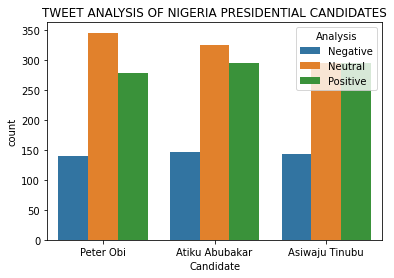

In [43]:
sns.countplot(data=tweets_df, x='Candidate', hue='Analysis')
plt.title('Tweet Analysis of Nigeria Presidential Candidates'.upper())

plt.show()